In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [20]:
from google.colab import files
uploaded = files.upload()

Saving dataset (2).csv to dataset (2).csv


In [21]:
file_path = "dataset (2).csv"
df = pd.read_csv(file_path)

In [23]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [24]:
df.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [25]:
df.shape

(112634, 17)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [27]:
for i in df.columns:
    uni = df[i].nunique()
    print(f'{i}: {uni}')

VIN (1-10): 7548
County: 165
City: 629
State: 45
Postal Code: 773
Model Year: 20
Make: 34
Model: 114
Electric Vehicle Type: 2
Clean Alternative Fuel Vehicle (CAFV) Eligibility: 3
Electric Range: 101
Base MSRP: 30
Legislative District: 49
DOL Vehicle ID: 112634
Vehicle Location: 758
Electric Utility: 73
2020 Census Tract: 2026


In [28]:
df.sample(2)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
71040,KNDC3DLC1N,Pierce,Tacoma,WA,98409,2022,KIA,EV6,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,29.0,203166274,POINT (-122.47554 47.21835),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,53053062902
40593,YV4BC0PL0H,King,Seattle,WA,98115,2017,VOLVO,XC90,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,0,43.0,224039056,POINT (-122.31765 47.70013),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),53033003601


In [29]:
year_counts = df['Model Year'].value_counts().sort_index()

In [30]:
year_counts

,count
Model Year,
1997,1
1998,1
1999,3
2000,10
2002,2
2008,23
2010,24
2011,840
2012,1705


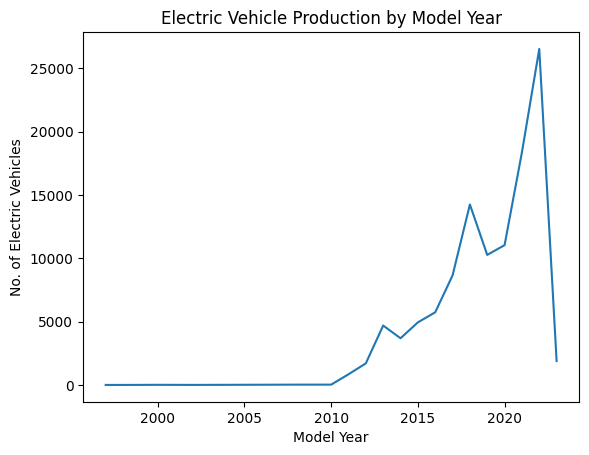

In [31]:
plt.plot(year_counts.index, year_counts.values)
plt.xlabel('Model Year')
plt.ylabel('No. of Electric Vehicles')
plt.title('Electric Vehicle Production by Model Year')
plt.show()

The electric vehicle production has seen a significant surge in recent years, with a dramatic increase from 2018 onwards.

In [33]:
df['Make'] = df['Make'].astype('category')

In [34]:
top_10_make = df['Make'].value_counts().head(10)

In [35]:
top_10_make

,count
Make,
TESLA,52078
NISSAN,12880
CHEVROLET,10182
FORD,5819
BMW,4680
KIA,4483
TOYOTA,4405
VOLKSWAGEN,2514
AUDI,2332


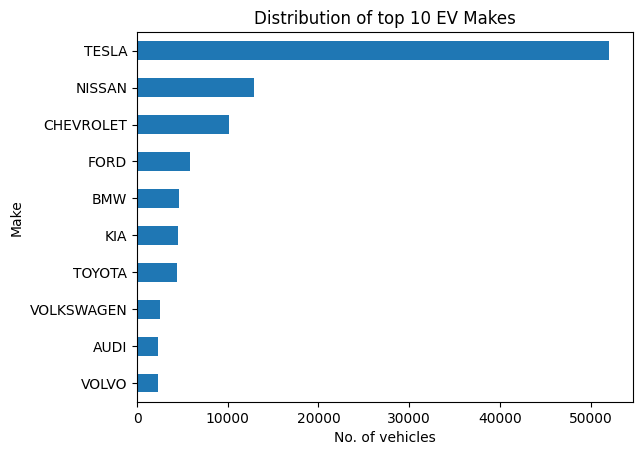

In [36]:
top_10_make.sort_values().plot(kind = 'barh')
plt.xlabel('No. of vehicles')
plt.ylabel('Make')
plt.title('Distribution of top 10 EV Makes')
plt.show()

### Tesla is the clear leader in the distribution of top 10 EV makes, with a significantly higher number of vehicles compared to the others.

### Nissan and Chevrolet follow Tesla, though with a considerable gap.

### The remaining EV makes (Ford, BMW, KIA, Toyota, Volkswagen, Audi, and Volvo) have relatively similar numbers of vehicles, suggesting a competitive landscape.

In [37]:
df.sample(1)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
72905,5YJSA1CG2D,Clallam,Port Angeles,WA,98362,2013,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208,69900,24.0,112896241,POINT (-123.4313 48.11872),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,53009001400


In [38]:
df['Electric Vehicle Type'].value_counts()

,count
Electric Vehicle Type,
Battery Electric Vehicle (BEV),86044
Plug-in Hybrid Electric Vehicle (PHEV),26590


In [39]:
ev_type = df['Electric Vehicle Type'].value_counts()

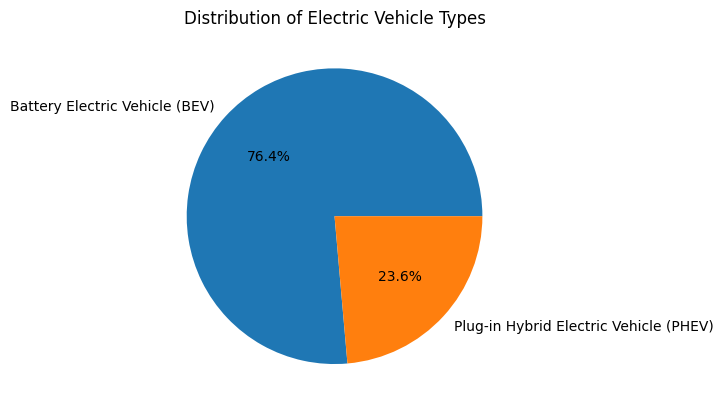

In [40]:
plt.pie(ev_type, labels = ev_type.index, autopct = '%1.1f%%')
plt.title('Distribution of Electric Vehicle Types')
plt.show()

### The pie chart clearly shows that BEVs constitute a significantly larger portion of the electric vehicle market, making up 76.4% of the total. This suggests a strong preference for fully electric vehicles.



In [41]:
CAFV_eligibility = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts()

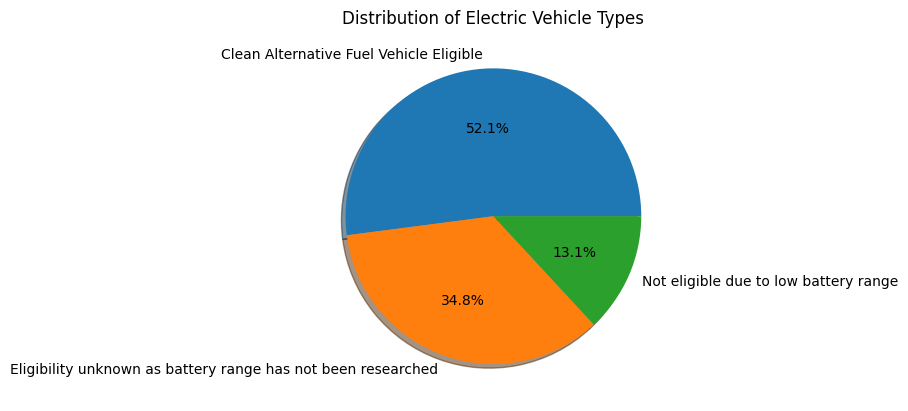

In [42]:
plt.pie(CAFV_eligibility, labels = CAFV_eligibility.index, autopct = '%1.1f%%', shadow = True)
plt.title('Distribution of Electric Vehicle Types')
plt.show()

<Axes: >

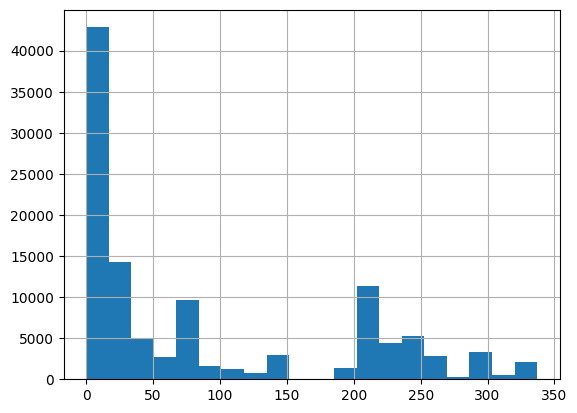

In [43]:
df['Electric Range'].hist(bins = 20)

### The distribution is right-skewed, meaning there are a few vehicles with very high electric ranges, pulling the tail of the distribution to the right.
### This indicates that most vehicles have a relatively lower range, while a smaller number have significantly higher ranges.

In [44]:
df.sample(2)

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
34598,5YJ3E1EB3M,Okanogan,Twisp,WA,98856,2021,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,12.0,179082578,POINT (-120.1231 48.3652),"OKANOGAN COUNTY ELEC COOP, INC",53047970900
70632,5YJ3E1EB0L,Walla Walla,Walla Walla,WA,99362,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,16.0,6030251,POINT (-118.34261 46.07068),PACIFICORP,53071920902


In [45]:
import plotly.express as px

In [59]:
df['State'].value_counts().head(10)

,count
State,
WA,112348
CA,76
VA,36
MD,26
TX,14
CO,9
NV,8
GA,7
NC,7


In [60]:
df.sample()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
103631,5YJ3E1EC4P,Pierce,Bonney Lake,WA,98391,2023,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,31.0,221055341,POINT (-122.17144 47.19175),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53053070208
957,JHMZC5F18L,Pierce,Orting,WA,98360,2020,HONDA,CLARITY,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,47,0,2.0,106968242,POINT (-122.20166 47.09596),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53053070403


In [47]:
ev_counts_by_state = df.groupby('State').size().reset_index(name='EV Count')

# Create the choropleth map
fig = px.choropleth(ev_counts_by_state,
                    locations='State',
                    locationmode='USA-states',
                    color='EV Count',
                    color_continuous_scale='Viridis',
                    scope='usa',
                    labels={'EV Count': 'Number of EVs'},
                    title='Number of Electric Vehicles by State')

# Display the map
fig.show()

**The state of Washington (WA) leads in the number of electric vehicles.**

In [61]:
df['longitude'] = df['Vehicle Location'].str.extract(r'POINT \(([-\d.]+) [-\d.]+\)')
df['latitude'] = df['Vehicle Location'].str.extract(r'POINT \([-\d.]+ ([-\d.]+)\)')


df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')

df_clean = df.dropna(subset=['longitude', 'latitude'])

fig = px.scatter_mapbox(df_clean,
                        lat='latitude',
                        lon='longitude',
                        hover_name='Make',
                        hover_data=['Model', 'Electric Vehicle Type'],
                        color_discrete_sequence=["blue"],
                        zoom=3,
                        height=600,
                        title='EV Vehicle Distribution by Location')

# Update layout for mapbox style
fig.update_layout(mapbox_style="open-street-map")

# Show the map
fig.show()

In [64]:
!pip install bar-chart-race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 3.0 MB/s eta 0:00:00


In [65]:
import bar_chart_race as bcr

In [93]:
df_grouped = df.groupby(['Model Year', 'Make']).size().reset_index(name='EV Count')

# Pivot the DataFrame so that 'Model Year' is the index, 'Make' is the columns, and 'EV Count' is the values
df_pivot = df_grouped.pivot(index='Model Year', columns='Make', values='EV Count').fillna(0)

# Generate the bar chart race animation
bcr.bar_chart_race(
    df=df_pivot,  # The pivoted DataFrame

    orientation='h',  # Horizontal orientation
    sort='desc',  # Sort bars in descending order
    n_bars=10,  # Number of bars to display
    steps_per_period=100,  # Smooth animation by increasing steps
    period_length=3000,  # Time per frame in milliseconds
    title = 'EV make and its count per year',
    bar_kwargs={'alpha': .99, 'lw': 0},  # Bar customization (opacity and line width)

    period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 30, 'weight': 'semibold'},  # Period label style
)